In [29]:
# use glob to get all .json files in the directory
import os
import glob
import json

# Get the list of files in the directory
files = glob.glob("Floorplans/**/*.json", recursive=True)

# Store the floorplan and sortplans in a tree structure
floorplans = {}
sortplans = {}

class Node:
    def __init__(self, name, content=None):
        self.name = name
        self.content = content
        self.children = {}
    
def add_path(tree, path, content=None):
    for part in path:
        if part not in tree.children:
            tree.children[part] = Node(part)
        tree = tree.children[part]
    # Add the content to the leaf node
    tree.content = content
    
root = Node("root")

for file_path in files:
    path = file_path.split('/')

    with open(file_path, 'r') as f:
        content = f.read()
    
    add_path(root, path, content)

def print_tree(node, depth=0):
    print('  ' * depth + node.name)
    for child in node.children.values():
        print_tree(child, depth + 1)

# Print the tree
print_tree(root)

print("Done")

root
  Floorplans
    parts
      infeeds
        dual-infeed-circle.json
        dual-infeed.json
      crossings
        crossing.json
      fingers
        single_finger.json
        dual_finger.json
    PrimeVision
      handover-belt
        6x3
          sortplan.json
          floorplan.json
        16x3
          sortplan.json
          floorplan.json
      trade-show
        sortplan.json
        floorplan.json
    single-infeed
      8x12_USPS
        sortplan.json
        floorplan.json
      3x2_USPS_CW
        sortplan.json
        floorplan.json
      5x6_USPS
        sortplan.json
        floorplan.json
      15x10_USPS
        sortplan.json
        floorplan.json
      6x13_USPS
        sortplan.json
        floorplan.json
      1x1_CW
        sortplan.json
        floorplan.json
      6x11_USPS
        sortplan.json
        floorplan.json
    RL
      Butterfly
        sortplan.json
        floorplan.json
      Garside
        sortplan.json
        floorplan.json
     

In [30]:
def find_node(node, path):
    if not path:
        return node
    for child in node.children.values():
        if child.name == path[0]:
            return find_node(child, path[1:])
    return None

def collect_content(node):
    if node.content is not None:
        contents = [node.content]
    else:
        contents = []
    for child in node.children.values():
        contents.extend(collect_content(child))
    return contents

# Replace with the path of the blob you want to find
blob_path = "Floorplans"

# Find the node
node = find_node(root, blob_path.split("/"))

# print all the children of the node
for child in node.children.values():
    print(child.name)
# print all the content of the node
for content in collect_content(node):
    print(content)


parts
PrimeVision
single-infeed
RL
dual-infeed
quad-infeed
USPS
{
  "zones": [
    {
      "id": "output_gate_1",
      "constraints": {
        "max_velocity": 0.8,
        "max_lateral_acceleration": 0.6,
        "max_corner_size": 1,
        "max_longitudinal_acceleration": 0.8,
        "max_longitudinal_deceleration": 0.6
      },
      "pose": [
        0,
        0,
        0
      ],
      "type": "fixed",
      "nodes": [
        {
          "id": "node_1586",
          "type": "target",
          "clear_distance": 0.1,
          "pose": [
            -2.2467285517247126,
            9.898970059292155,
            -1.57079632679
          ],
          "connections": [
            {
              "connects_to": "nje5kf",
              "reachable_from": [
                "wlhnth"
              ],
              "type": "normal",
              "blocking_neighbours": [],
              "control_points": []
            }
          ]
        },
        {
          "id": "r7ap9d",
     

In [31]:
# Replace with the path of the floorplan you want to plot
floorplan_path = "Floorplans/RL/Garside"

# Find the node
node = find_node(root, floorplan_path.split("/"))

class TreeNode:
    def __init__(self, id, type, clear_distance, pose, connections, zone):
        self.id = id
        self.type = type
        self.clear_distance = clear_distance
        self.pose = pose
        self.zone = zone 
        self.connections = connections
        self.children = {}
    
    def __str__(self):
        return f"Node {self.id}: {self.type} at {self.pose}"
    def __repr__(self):
        return f"Node {self.id}: {self.type} at {self.pose}"

class Tree:
    def __init__(self):
        self.nodes = {}

    def add_node(self, id, type, clear_distance, pose, connections, zone):
        if id not in self.nodes:
            node = TreeNode(id, type, clear_distance, pose, connections, zone)
            self.nodes[id] = node
        return self.nodes[id]

    def add_edge(self, parent_id, child_id):
        if parent_id in self.nodes and child_id in self.nodes:
            parent = self.nodes[parent_id]
            child = self.nodes[child_id]
            parent.children[child_id] = child
        else:
            print(f"Warning: Attempted to add edge from {parent_id} to {child_id}, but one or both nodes are not in the tree.")
    
    def print_tree(self):
        for node_id in self.nodes:
            self._print_subtree(self.nodes[node_id])

    def _print_subtree(self, node, indent=0):
        print('  ' * indent + str(node))
        for child in node.children.values():
            self._print_subtree(child, indent + 1)


class Bin:
    def __init__(self, id, data):
        self.id = id.split("/")[-1]
        self.type = data["type"]
        self.sub_directions = data["sub_directions"]
    def __str__(self):
        return f"Bin {self.id}: {self.type}"    
    def __repr__(self):
        return f"Bin {self.id}: {self.type}"

tree = Tree()

# Load the json file
import json
floorplan = collect_content(node)[1]
sortplan = collect_content(node)[0]
floorplan = json.loads(floorplan)
sortplan = json.loads(sortplan)

# Hashtable of bins by id
bins = {id: Node(id, node_data) for id, node_data in sortplan.items()}

# Flatten the nodes from the zones
nodes = []
for zone in floorplan["zones"]:
    for node in zone["nodes"]:
        # Add the zone id to the node
        node["zone"] = zone["id"]
        nodes.append(node)

# Add nodes to the tree
for node in nodes:
    tree.add_node(node['id'], node['type'], node['clear_distance'], node['pose'], node['connections'], node['zone'])

# Add edges to the tree
for node in nodes:
    for connection in node['connections']:
        tree.add_edge(node['id'], connection['connects_to'])

# tree.print_tree()

In [32]:
# Compute the statistics of this graph

# Graph size: number of nodes and edges
num_nodes = len(tree.nodes)
num_edges = sum(len(node.connections) for node in tree.nodes.values())

# Graph density: ratio of edges to the maximum number of edges
density = 2 * num_edges / ( num_nodes * ( num_nodes - 1))

# Average degree: average number of edges per node
average_degree = num_edges / num_nodes

def dfs(node, visited):
    visited.add(node.id)
    for child in node.children.values():
        if child.id not in visited:
            dfs(child, visited)

# Compute the average number of nodes visited by a DFS
result = []
for node in tree.nodes.values():
    visited = set()
    dfs(node, visited)
    result.append(len(visited))

# Compute the average number of nodes visited by a DFS
avg_dfs = sum(result) / len(result)

print(f"Number of nodes: {num_nodes}")
print(f"Number of edges: {num_edges}")
print(f"Density: {density}")
print(f"Average degree: {average_degree}")
print(f"Avg Number of nodes visited by DFS: {avg_dfs}")

Number of nodes: 436
Number of edges: 487
Density: 0.005135505641674576
Average degree: 1.1169724770642202
Avg Number of nodes visited by DFS: 74.43577981651376


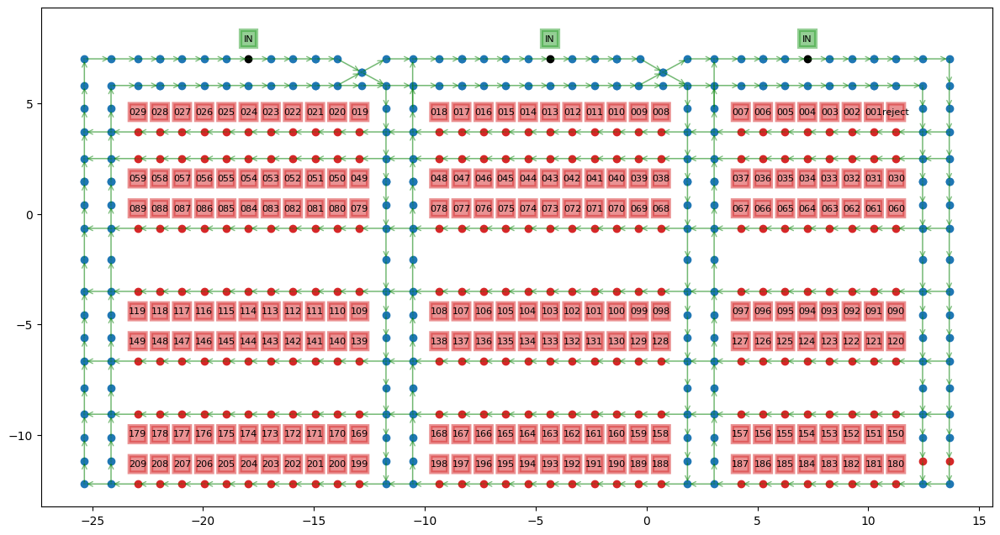

Plot saved as chicago_floorplan.png


In [33]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import Polygon
from matplotlib.transforms import Affine2D
import math

bin_color_map = {
    'input': 'tab:green',
    'output': 'tab:red'
}

def transform_euler(offset, position, orientation_z):
    """
    Perform Euler transformation for a 2D case, applying the rotation by orientation_z
    to the offset and returning the new position.
    """
    x_offset, y_offset, z_offset = offset
    x_position, y_position = position

    # Perform 2D rotation using Euler angles (cos and sin of the orientation)
    x_trans = x_position + (x_offset * math.cos(orientation_z) - y_offset * math.sin(orientation_z))
    y_trans = y_position + (x_offset * math.sin(orientation_z) + y_offset * math.cos(orientation_z))

    return [x_trans, y_trans]
    
class FloorplanPlotter:
    def __init__(self, tree, nodes, color_map):
        self.tree = tree
        self.nodes = nodes
        self.color_map = color_map

    def plot_nodes(self, ax):
        for node in self.nodes:
            plt.scatter(node['pose'][0], node['pose'][1], color=self.color_map.get(node['type'], 'black'))

    def plot_edges(self, ax):
        for node in self.nodes:
            for connection in node['connections']:
                if connection['connects_to'] in self.tree.nodes:
                    start = node['pose'][:2]
                    end = self.tree.nodes[connection['connects_to']].pose[:2]
                    ax.plot([start[0], end[0]], [start[1], end[1]], color='g', alpha=0.1)
                    # Plot the edge with an arrow indicating the direction
                    ax.annotate(
                        '', xy=end, xytext=start,
                        arrowprops=dict(arrowstyle='->', color='g', alpha=0.5))

    def calculate_box_pose(self, pose, orientation, side):
        offset = [0.0, -0.9, 0.0] if side > 0 else [0.0, 0.9, 0.0]
        trans = transform_euler(offset, [pose['x'], pose['y']], orientation['z'])
        box_pose = [trans[0], trans[1], abs(orientation['z'])]
        return box_pose

    def plot_bins(self, ax, bins):
            for node in self.nodes:
                search_id = f"/{node['zone']}/{node['id']}"
                current_bin = bins.get(search_id)
                if current_bin:
                    bin_type = current_bin.content.get('type')
                    color = bin_color_map.get(bin_type, 'black')

                    sub_directions = current_bin.content.get('sub_directions', {'IN': {'side': -1}})
                    
                    for sub_dir, properties in sub_directions.items():
                        side = properties.get('side', -1)
                        box_size = 0.75
                        pose = {'x': node['pose'][0], 'y': node['pose'][1]}
                        orientation = {'z': node['pose'][2]}
                        
                        x, y, theta = self.calculate_box_pose(pose, orientation, side)

                        # Create a rectangle as a polygon centered at (x, y)
                        rectangle = Polygon(
                            [(x - box_size / 2, y - box_size / 2),
                            (x - box_size / 2, y + box_size / 2),
                            (x + box_size / 2, y + box_size / 2),
                            (x + box_size / 2, y - box_size / 2)],
                            closed=True, edgecolor=color, facecolor=color, linewidth=3, alpha=0.5)

                        # Create a rotation matrix
                        rotation_matrix = Affine2D().rotate_deg_around(x, y, math.degrees(theta))
                        rectangle.set_transform(rotation_matrix + ax.transData)

                        ax.add_patch(rectangle)
                        ax.text(x, y, sub_dir, ha='center', va='center', color='black', fontsize=8)

    def plot_floorplan(self, bins, figsize=(10, 10), save_as=None, autoscale=True, dpi=300):
        # Create a figure and axis
        fig, ax = plt.subplots(figsize=figsize)
        
        # Plot nodes, edges, and bins
        self.plot_nodes(ax)
        self.plot_edges(ax)
        self.plot_bins(ax, bins)
        
        # Set equal aspect ratio
        ax.set_aspect('equal')

        # Autoscale axes based on data
        if autoscale:
            ax.autoscale()

        # Tighten the layout
        plt.tight_layout()

        # Show the plot
        plt.show()

        # Save the figure if requested
        if save_as:
            fig.savefig(save_as, dpi=dpi, bbox_inches='tight')
            print(f"Plot saved as {save_as}")


color_map = {
    'init': 'tab:blue',
    'target': 'tab:red',
    'entry_and_exit': 'tab:blue'
}

# Example usage assuming bins, tree, and nodes data structures are provided
plotter = FloorplanPlotter(tree, nodes, color_map)
plotter.plot_floorplan(bins, figsize=(12, 8), save_as="chicago_floorplan.png", autoscale=True)